# Analyse Baseline Autoencoder Model: Failure Cases

In [1]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision.transforms import Compose
from tqdm import tqdm
import mlflow.pytorch
import imgaug.augmenters as iaa
from pprint import pprint
import pandas as pd
import cv2

import mlflow

import matplotlib.pyplot as plt
%matplotlib inline

sys.path.append('../../../')

from src.data import TrainValTestSplitter, MURASubset
from src.data.transforms import GrayScale, Padding, Resize, HistEqualisation, MinMaxNormalization, ToTensor
from src.features.augmentation import Augmentation
#from src.models.autoencoders import BaselineAutoencoder
from src.models.torchsummary import summary
from src import DATA_PATH, MODELS_DIR, MLFLOW_TRACKING_URI
from src.models import BaselineAutoencoder

/usr/lib/python3/dist-packages/requests/__init__.py:80: RequestsDependencyWarning: urllib3 (1.24.3) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


## Setup

Set up general parameters and get model from MLFlow

In [2]:
size_sample = 20 # set how many image to be analysed

In [3]:
client = mlflow.tracking.MlflowClient(MLFLOW_TRACKING_URI)
client.list_experiments()

[<Experiment: artifact_location='/home/ubuntu/mlruns/2', experiment_id='2', lifecycle_stage='active', name='BottleneckAutoencoder'>,
 <Experiment: artifact_location='/home/ubuntu/mlruns/1', experiment_id='1', lifecycle_stage='active', name='BaselineAutoencoder'>,
 <Experiment: artifact_location='./mlruns/4', experiment_id='4', lifecycle_stage='active', name='DCGAN'>,
 <Experiment: artifact_location='./mlruns/3', experiment_id='3', lifecycle_stage='active', name='VAE'>,
 <Experiment: artifact_location='./mlruns/8', experiment_id='8', lifecycle_stage='active', name='AlphaGan'>,
 <Experiment: artifact_location='./mlruns/7', experiment_id='7', lifecycle_stage='active', name='Bottleneck'>,
 <Experiment: artifact_location='./mlruns/6', experiment_id='6', lifecycle_stage='active', name='SkipConnection'>,
 <Experiment: artifact_location='./mlruns/9', experiment_id='9', lifecycle_stage='active', name='SAGAN'>]

In [4]:
run_id = '0ca304cc755f4203a5c6576edb14e4b9'
experiment = client.get_experiment('1')
path = f'{experiment.artifact_location}/{run_id}/artifacts/baseline_autoencoder/data/model.pth'
path

'/home/ubuntu/mlruns/1/0ca304cc755f4203a5c6576edb14e4b9/artifacts/baseline_autoencoder/data/model.pth'

Set up parameters and initiate model and dataset.

In [5]:
data_path = f'{DATA_PATH}/XR_HAND_CROPPED'


splitter = TrainValTestSplitter(data_path) 

run_params = {
    'batch_size': 64,
    'image_resolution': (512, 512),
    'num_epochs': 500,
    'batch_normalisation': True,
    'pipeline': {
        'hist_equalisation': True,
        'cropped': False,
    }
}

composed_transforms = Compose([GrayScale(),
                               Padding(),
                               Resize(run_params['image_resolution']),
                               HistEqualisation(active=run_params['pipeline']['hist_equalisation']),
                               MinMaxNormalization(),
                               ToTensor()])

validation = MURASubset(filenames=splitter.data_val.path, true_labels=splitter.data_val.label,
                        patients=splitter.data_val.patient, transform=composed_transforms)


num_workers = 6

device = "cuda"
model = torch.load(path)

outer_loss = nn.MSELoss(reduction='none')
model.eval().to(device)

=================Train subset=================
Size: 2846
Percentage from original data: 0.5134403752480606
Percentage of negatives: 1.0
Number of patients: 1017
=============Validation subset===============
Size: 1356
Percentage from original data: 0.24463287028684827
Percentage of negatives: 0.4837758112094395
Number of patients: 473
=================Test subset=================
Size: 1341
Percentage from original data: 0.2419267544650911
Percentage of negatives: 0.4153616703952274
Number of patients: 474


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'src.models.autoencoders.BaselineAutoencoder' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


BaselineAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU()
    (10): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (15): ReLU()
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): ReLU()
    (18): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (19): ReLU()
  )
  (decoder): Sequentia

In [6]:
composed_transforms = Compose([GrayScale(),
                               Padding(max_shape=(750, 750)),  # max_shape - max size of image after augmentation
                               Resize(run_params['image_resolution']),
                               HistEqualisation(active=run_params['pipeline']['hist_equalisation']),
                               MinMaxNormalization(),
                               ToTensor()])

# Dataset loaders
print(f'\nDATA SPLIT:')
splitter = TrainValTestSplitter(path_to_data=data_path)
validation = MURASubset(filenames=splitter.data_val.path, true_labels=splitter.data_val.label,
                        patients=splitter.data_val.patient, transform=composed_transforms)

val_loader = DataLoader(validation, batch_size=run_params['batch_size'], shuffle=True, num_workers=num_workers)


DATA SPLIT:
=================Train subset=================
Size: 2846
Percentage from original data: 0.5134403752480606
Percentage of negatives: 1.0
Number of patients: 1017
=============Validation subset===============
Size: 1356
Percentage from original data: 0.24463287028684827
Percentage of negatives: 0.4837758112094395
Number of patients: 473
=================Test subset=================
Size: 1341
Percentage from original data: 0.2419267544650911
Percentage of negatives: 0.4153616703952274
Number of patients: 474


## Run evaluation

In [ ]:
val_metrics = model.evaluate(val_loader, 'validation', 
                             outer_loss, device, log_to_mlflow=False)

In [8]:
masked_loss_on_val = False
# Evaluation mode
model.eval()
with torch.no_grad():
    scores = []
    true_labels = []
    file_path = []
    for batch_data in tqdm(val_loader, desc='type', total=len(val_loader)):
        # Format input batch
        inp = batch_data['image'].to(device)
        mask = batch_data['mask'].to(device)

        # Forward pass
        output = model(inp)
        loss = outer_loss(output, inp, mask) if masked_loss_on_val else outer_loss(output, inp)

        # Scores, based on MSE - higher MSE correspond to abnormal image
        if masked_loss_on_val:
            sum_loss = loss.to('cpu').numpy().sum(axis=(1, 2, 3))
            sum_mask = mask.to('cpu').numpy().sum(axis=(1, 2, 3))
            score = sum_loss / sum_mask
        else:
            score = loss.to('cpu').numpy().mean(axis=(1, 2, 3))

        scores.extend(score)
        true_labels.extend(batch_data['label'].numpy())
        file_path.extend(batch_data['filename'])

val_metrics = {'loss': scores, 'true_label': true_labels, 'file_path': file_path}

type: 100%|██████████| 22/22 [00:07<00:00,  3.06it/s]


In [9]:
print(val_metrics)

{'loss': [0.0014007598, 0.0009994514, 0.0010380744, 0.0013025159, 0.00033991406, 0.00060717325, 0.00033761005, 0.0005892989, 0.00038125442, 0.0011444513, 0.0009078351, 0.00061522773, 0.0013036118, 0.00067976007, 0.00064911076, 0.0009591767, 0.00053354056, 0.00052400416, 0.00081888883, 0.0008986745, 0.00039918345, 0.005717, 0.00044478962, 0.00068548345, 0.0005644943, 0.0021427746, 0.0008479732, 0.0010105607, 0.0005003969, 0.0003605866, 0.00071217935, 0.0013726845, 0.00058287947, 0.0009445448, 0.00069460855, 0.0004970985, 0.0011734958, 0.00066514, 0.00073275855, 0.0005387307, 0.00077321246, 0.0023039542, 0.00050846115, 0.00063552643, 0.00029976616, 0.0007312541, 0.00076496025, 0.0008142175, 0.0006381723, 0.0022156588, 0.0014243367, 0.00064262137, 0.0010974725, 0.0008407472, 0.00058246474, 0.00090898294, 0.00097025617, 0.0009850292, 0.00079206366, 0.0005875968, 0.0014185864, 0.0005593832, 0.0005811054, 0.00048064007, 0.0007073324, 0.0005897574, 0.0008794651, 0.0005194961, 0.0010967752, 0.

### Set up data frame for evaluation

This evaluation is based on validation set and follows the idea of ROC AUC. High MSE should be predicated as 1 and low as 0.

In [10]:
data = pd.DataFrame.from_dict(val_metrics)


In [11]:
print(data)

          loss  true_label                                          file_path
0     0.001401           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
1     0.000999           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
2     0.001038           1  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
3     0.001303           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
4     0.000340           1  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
5     0.000607           1  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
6     0.000338           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
7     0.000589           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
8     0.000381           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
9     0.001144           1  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
10    0.000908           0  /home/viet/xray/data/train/XR_HAND_CROPPED/pat...
11    0.000615           0  /home/viet/xray/data/train/XR_HAND_C

### Analyse False Negative

In [12]:
false_negative = data[data['true_label'] == 1].nsmallest(size_sample, 'loss')
false_negative.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path
98,0.000199409,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09738/study1_positive/image2.png
211,0.000206453,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09992/study1_positive/image3.png
613,0.000207771,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient07140/study1_positive/image2.png
144,0.000236519,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10017/study1_positive/image2.png
575,0.000236773,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09854/study1_positive/image3.png
498,0.000240124,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient08792/study1_positive/image2.png
361,0.000242348,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09854/study1_positive/image2.png
279,0.000246457,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09974/study1_positive/image2.png
1097,0.000264292,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09978/study1_positive/image2.png
672,0.000266986,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09905/study1_positive/image2.png


In [13]:
files_false_negative_path = false_negative['file_path']
files_false_negative = MURASubset(filenames=files_false_negative_path, transform=composed_transforms)

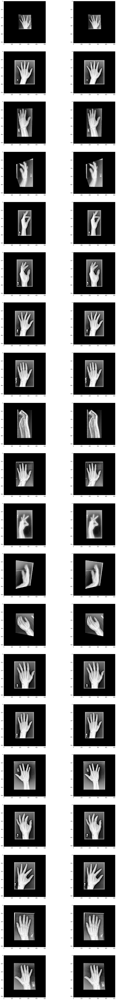

In [15]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

Reasons for false negative:
  - relatively small images with a lot of black space
  - relatively little noise
  - common hands except for the arm without hand (why can the model reconstruct this so good?) and one with only parts of the hand

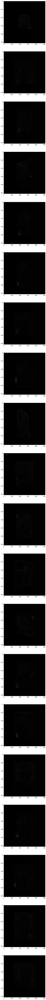

In [16]:
fig, ax = plt.subplots(nrows=size_sample, ncols=1, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    image_substract = output.cpu().detach().numpy()[0, 0, :, :] - image_inp.numpy()[0, 0, :, :]
    ax[i].imshow(image_substract, cmap='gray', vmin=0, vmax=1)

### Analyse False positive

In [17]:
false_positive = data[data['true_label'] == 0].nlargest(size_sample, 'loss')
false_positive.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path
432,0.00616373,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient04442/study1_negative/image1.png
493,0.00597094,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient11091/study1_negative/image3.png
562,0.0059173,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient04442/study1_negative/image2.png
21,0.005717,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10709/study2_negative/image1.png
750,0.00420773,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10279/study1_negative/image2.png
219,0.00416955,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient11115/study1_negative/image3.png
235,0.00379517,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient11115/study1_negative/image2.png
615,0.00363524,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient06885/study1_negative/image2.png
940,0.00350866,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient05563/study1_negative/image2.png
111,0.0034657,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient01853/study2_negative/image3.png


In [18]:
files_false_positive_path = false_positive['file_path']
files_false_positive = MURASubset(filenames=files_false_positive_path, transform=composed_transforms)

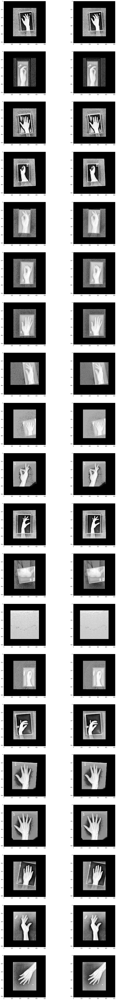

In [19]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

Reasons for false positive:
  - a lot of noise around the hand &rarr; masking might help

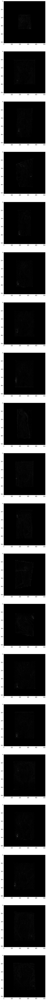

In [20]:
fig, ax = plt.subplots(nrows=size_sample, ncols=1, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    image_substract = output.cpu().detach().numpy()[0, 0, :, :] - image_inp.numpy()[0, 0, :, :]
    ax[i].imshow(image_substract, cmap='gray', vmin=0, vmax=1)

### Analyse True Negative

In [21]:
true_negative = data[data['true_label'] == 0].nsmallest(size_sample, 'loss')
true_negative.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path
1000,0.000126251,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient05789/study1_negative/image1.png
136,0.000153737,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient05789/study1_negative/image3.png
1113,0.000212842,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient06885/study1_negative/image1.png
1051,0.000237429,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient06885/study1_negative/image3.png
1010,0.000238874,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10163/study1_negative/image2.png
986,0.000246638,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10217/study1_negative/image3.png
853,0.00024718,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10401/study1_negative/image2.png
114,0.000247482,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient01113/study1_negative/image3.png
216,0.000251505,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10164/study1_negative/image2.png
1294,0.000253596,0,/home/viet/xray/data/train/XR_HAND_CROPPED/patient04230/study1_negative/image1.png


In [22]:
files_true_negative_path = true_negative['file_path']
files_true_negative = MURASubset(filenames=files_true_negative_path, transform=composed_transforms)

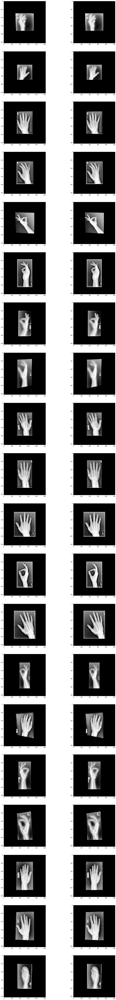

In [23]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

### Analyse True Positive

In [24]:
true_positive = data[data['true_label'] == 1].nlargest(size_sample, 'loss')
true_positive.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path
734,0.0113791,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09784/study1_positive/image4.png
578,0.00884985,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09798/study1_positive/image1.png
518,0.0064307,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09809/study1_positive/image2.png
1296,0.0038613,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09798/study1_positive/image2.png
807,0.00375432,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09424/study2_positive/image2.png
603,0.00295635,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09889/study1_positive/image2.png
1023,0.00292931,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09879/study1_positive/image1.png
399,0.00290435,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient10095/study1_positive/image2.png
485,0.00284843,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09768/study1_positive/image2.png
49,0.00221566,1,/home/viet/xray/data/train/XR_HAND_CROPPED/patient09424/study2_positive/image1.png


In [25]:
files_true_positive_path = true_positive['file_path']
files_true_positive = MURASubset(filenames=files_true_positive_path, transform=composed_transforms)

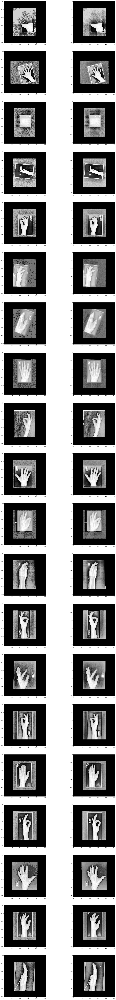

In [26]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

Reasions for true positive:
  - a lot of noise &rarr; model can't reconstruct noise &rarr; classified as positve see following plot

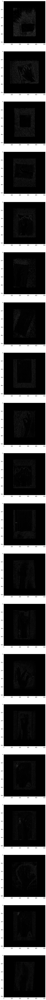

In [27]:
fig, ax = plt.subplots(nrows=size_sample, ncols=1, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    image_substract = output.cpu().detach().numpy()[0, 0, :, :] - image_inp.numpy()[0, 0, :, :]
    ax[i].imshow(image_substract, cmap='gray', vmin=0, vmax=1)